# Coin Detection

So far we have studied about various mophological operations and different thresholding techniques in some detail. Now it's time to apply these concepts for a practical application - **Coin Detection**.

## Aim

In this notebook, you will work with 2 different images (so 2 different parts) and will use **only** morphological operations and thresholding techniques to detect the total number of coins present in the image.

## Outline

The main steps that you can follow to solve this assignment are:

1. Read the image.
2. Convert it to grayscale and split the image into the 3 (Red, Green and Blue) channels. Decide which of the above 4 images you want to use in further steps and provide reason for the same.
3. Use thresholding and/or morphological operations to arrive at a final binary image.
4. Use **simple blob detector** to count the number of coins present in the image.
5. Use **contour detection** to count the number of coins present in the image.
6. Use **CCA** to count the number of coins present in the image.


## 1. Imports

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

In [2]:
import matplotlib
matplotlib.rcParams['figure.figsize'] = (10.0, 10.0)
matplotlib.rcParams['image.cmap'] = 'gray'

In [3]:
# Enable intellisense
%config IPCompleter.greedy=True

Text(0.5, 1.0, 'Original Image')

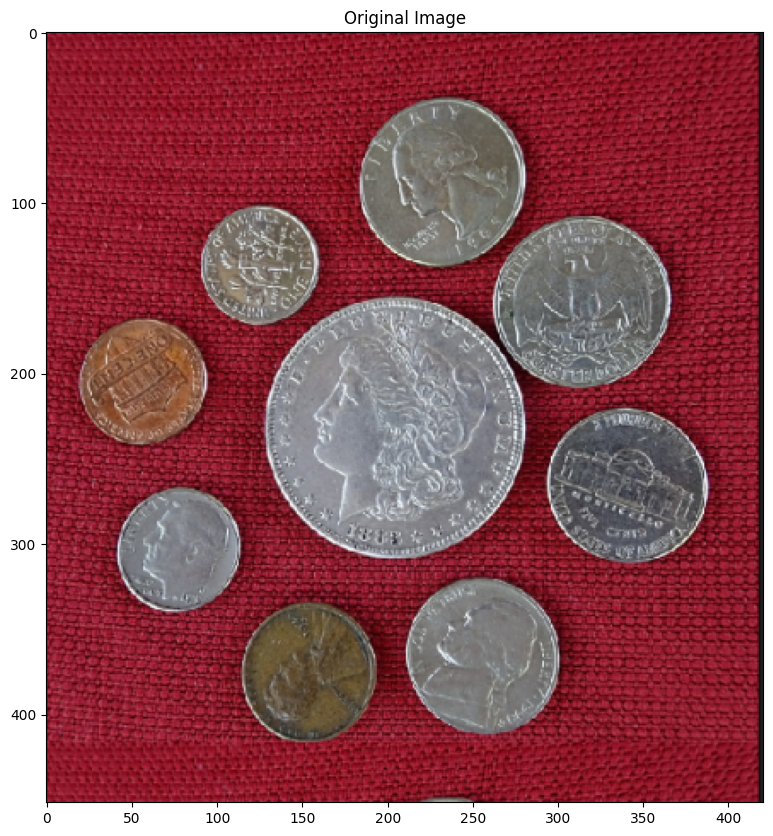

In [4]:

# Image path
imagePath = "./images/coins.png"

# Read image
image = cv2.imread(imagePath)

imageCopy = image.copy()
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")

In [5]:
# Convert image to grayscale
# Store it in the variable imageGray
imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


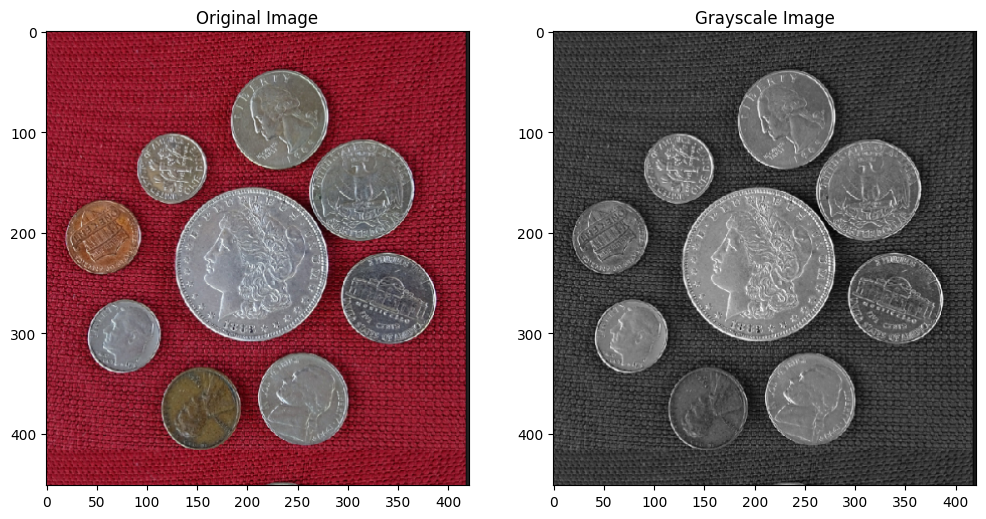

In [6]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(122)
plt.imshow(imageGray);
plt.title("Grayscale Image");

In [7]:
# Split cell into channels
# Store them in variables imageB, imageG, imageR
imageR = image[:,:,2]
imageG = image[:,:,1]
imageB = image[:,:,0]

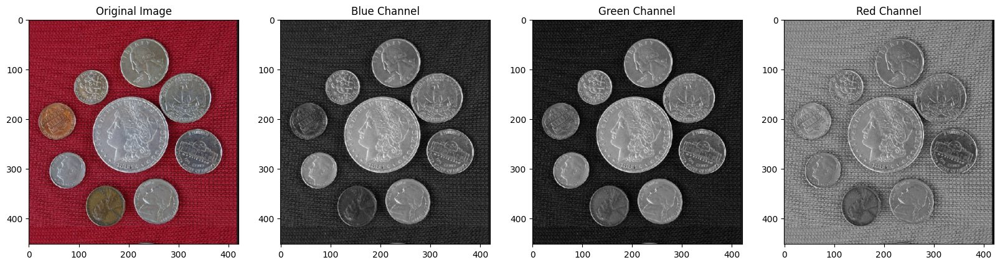

In [8]:
plt.figure(figsize=(20,12))
plt.subplot(141)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(142)
plt.imshow(imageB);
plt.title("Blue Channel")
plt.subplot(143)
plt.imshow(imageG);
plt.title("Green Channel")
plt.subplot(144)
plt.imshow(imageR);
plt.title("Red Channel");

## Perform Thresholding

You will have to carry out this step with different threshold values to see which one suits you the most. Do not remove those intermediate images and make sure to document your findings.

bool (452, 421) (452, 421) uint8


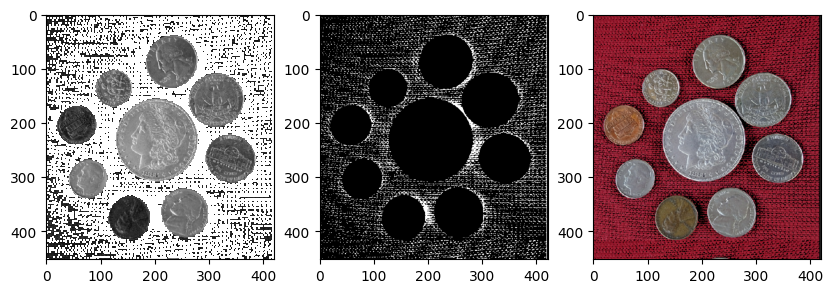

In [9]:
# numpy masking
maskB = image[...,0] < 25
maskG = image[...,1] < 25
maskR = np.ones(imageR.shape)
mask = np.bitwise_and(maskB, maskG)

imgcopy = image.copy()
imgcopy[mask] = 0

# what is mask type, shape, etc?
print(maskB.dtype, maskB.shape, np.ma.masked_array(imageB, mask=maskB).shape, np.ma.masked_array(imageB, mask=maskB).dtype)

# what does an applied mask look like?
plt.subplot(131)
plt.imshow(np.ma.masked_array(imageB, mask=mask))

# what does the mask look like
plt.subplot(132)
plt.imshow(mask)

plt.subplot(133)
plt.imshow(imgcopy[:,:,::-1])
###

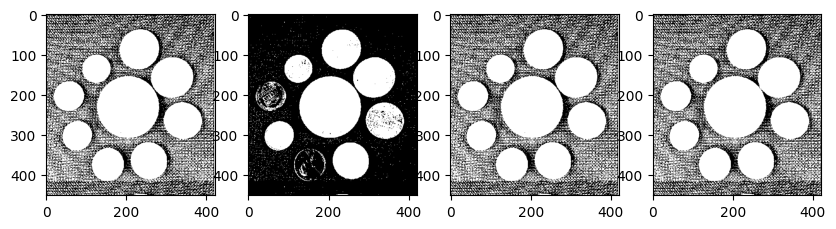

In [10]:
# openCV thresholding

# THRESH_BINARY  -> greater than
# THRESH_BINARY_INV -> less than
thb, imBth = cv2.threshold(imageB, 75 ,255, cv2.THRESH_BINARY)
thg, imGth = cv2.threshold(imageG, 25, 255, cv2.THRESH_BINARY)
thr, imRth = cv2.threshold(imageR, 30, 255, cv2.THRESH_BINARY_INV)

'''

maximize the circle of the coins and minimize the background using combined masks from
the RGB image then perform a binary not

''' 

immax = cv2.max(imBth, imGth)

plt.subplot(141)
plt.imshow(immax)

immin = cv2.min(imBth, imGth)

plt.subplot(142)
plt.imshow(immin)

immax = cv2.max(immax, immin)

plt.subplot(143)
plt.imshow(immax)

immax = cv2.max(immax, imRth)

plt.subplot(144)
plt.imshow(immax)


my final output


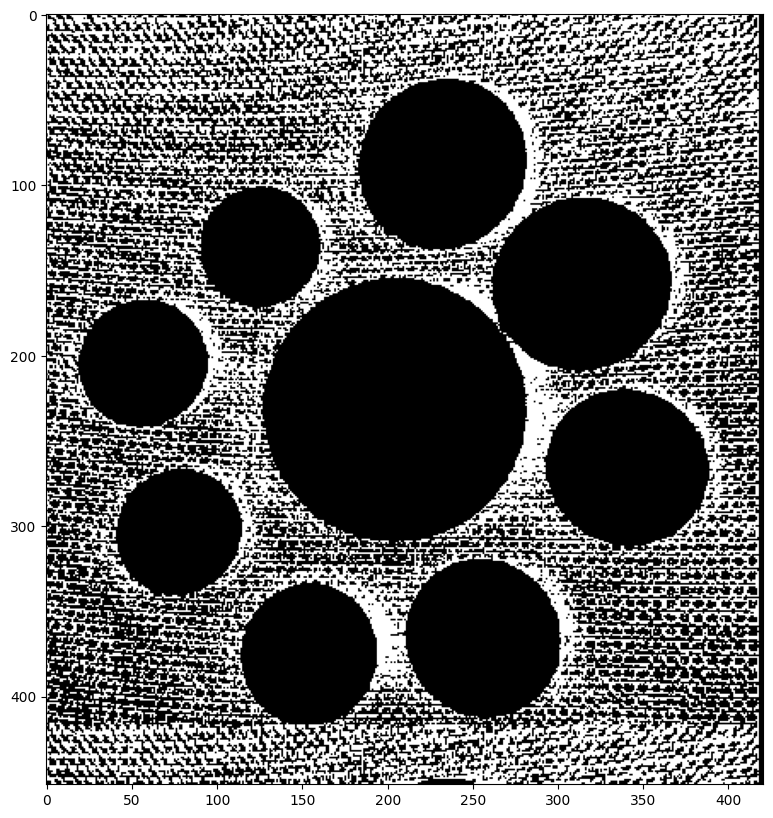

In [11]:
# Display the thresholded image
print('my final output')
max_not = cv2.bitwise_not(immax)
plt.imshow(max_not)

## Perform morphological operations

You will have to carry out this step with different kernel size, kernel shape and morphological operations to see which one (or more) suits you the most. Do not remove those intermediate images and make sure to document your findings.

In [12]:
###
m_3x3cross = cv2.getStructuringElement(cv2.MORPH_CROSS ,(3,3))
m_3x3rect = cv2.getStructuringElement(cv2.MORPH_RECT,(3,3))

m_4x4ellipse = cv2.getStructuringElement(cv2.MORPH_ELLIPSE ,(4,4))
m_4x4rect = cv2.getStructuringElement(cv2.MORPH_RECT, (4,4))

m_5x5ellipse = cv2.getStructuringElement(cv2.MORPH_ELLIPSE ,(5,5))
m_5x5rect = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))


In [13]:
# find the best image in the least amount of iterations
i = 3
d_3x3cross = cv2.dilate(max_not, m_3x3cross, iterations = i)
d_3x3rect = cv2.dilate(max_not, m_3x3rect, iterations = i)
d_4x4ellipse = cv2.dilate(max_not, m_4x4ellipse, iterations = i)
d_4x4rect = cv2.dilate(max_not, m_4x4rect, iterations = i)
d_5x5ellipse = cv2.dilate(max_not, m_5x5ellipse, iterations = i)
d_5x5rect = cv2.dilate(max_not, m_5x5rect, iterations = i)


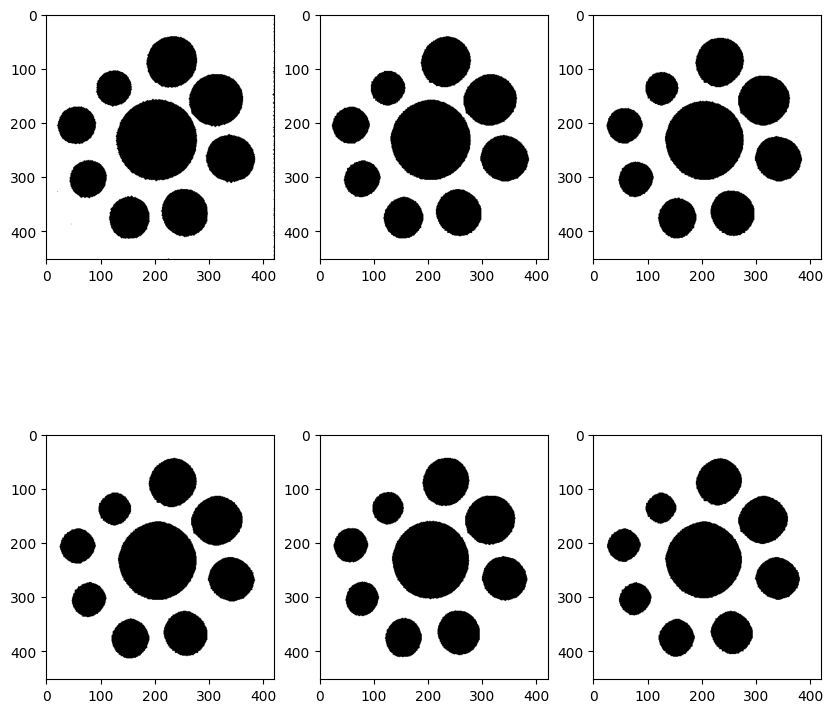

In [14]:
plt.subplot(231)
plt.imshow(d_3x3cross)
plt.subplot(232)
plt.imshow(d_3x3rect)
plt.subplot(233)
plt.imshow(d_4x4ellipse)
plt.subplot(234)
plt.imshow(d_4x4rect)
plt.subplot(235)
plt.imshow(d_5x5ellipse)
plt.subplot(236)
plt.imshow(d_5x5rect)

my final output


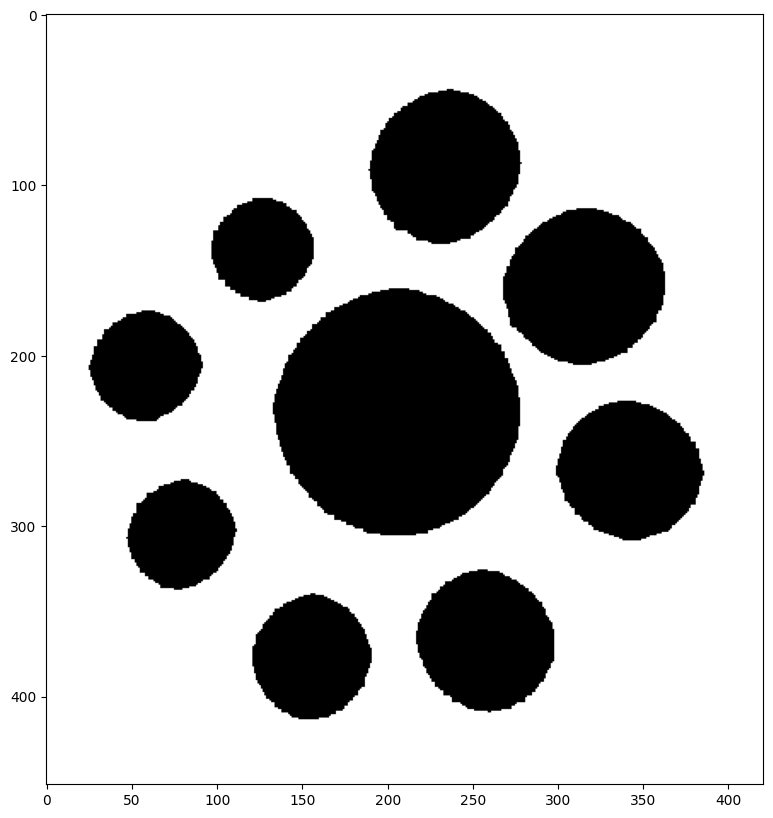

In [15]:
print('my final output')
choice = d_4x4rect
plt.imshow(choice)

In [16]:
# Get structuring element/kernel which will be used for dilation
# Raise the kernels
m_3x3cross = cv2.getStructuringElement(cv2.MORPH_CROSS ,(3,3))
m_3x3rect = cv2.getStructuringElement(cv2.MORPH_RECT,(3,3))

m_4x4ellipse = cv2.getStructuringElement(cv2.MORPH_ELLIPSE ,(4,4))
m_4x4rect = cv2.getStructuringElement(cv2.MORPH_RECT, (4,4))

m_5x5ellipse = cv2.getStructuringElement(cv2.MORPH_ELLIPSE ,(5,5))
m_5x5rect = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))


In [17]:
# find the best image in the least amount of iterations
i = 2
e_3x3cross = cv2.erode(choice, m_3x3cross, iterations = i)
e_3x3rect = cv2.erode(choice, m_3x3rect, iterations = i)
e_4x4ellipse = cv2.erode(choice, m_4x4ellipse, iterations = i)
e_4x4rect = cv2.erode(choice, m_4x4rect, iterations = i)
e_5x5ellipse = cv2.erode(choice, m_5x5ellipse, iterations = i)
e_5x5rect = cv2.erode(choice, m_5x5rect, iterations = i)

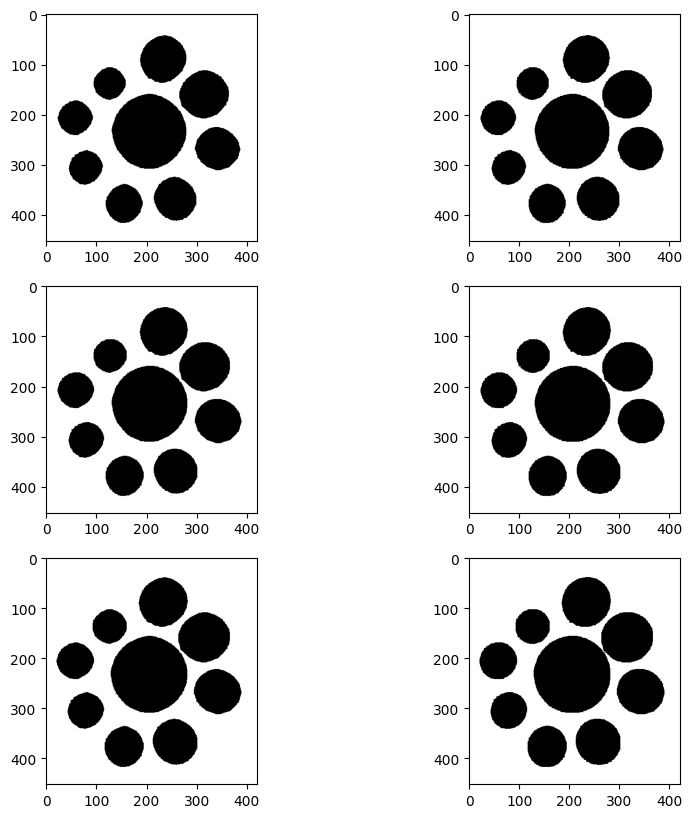

In [18]:
# look for the best one
plt.subplot(321)
plt.imshow(e_3x3cross)
plt.subplot(322)
plt.imshow(e_3x3rect)
plt.subplot(323)
plt.imshow(e_4x4ellipse)
plt.subplot(324)
plt.imshow(e_4x4rect)
plt.subplot(325)
plt.imshow(e_5x5ellipse)
plt.subplot(326)
plt.imshow(e_5x5rect)

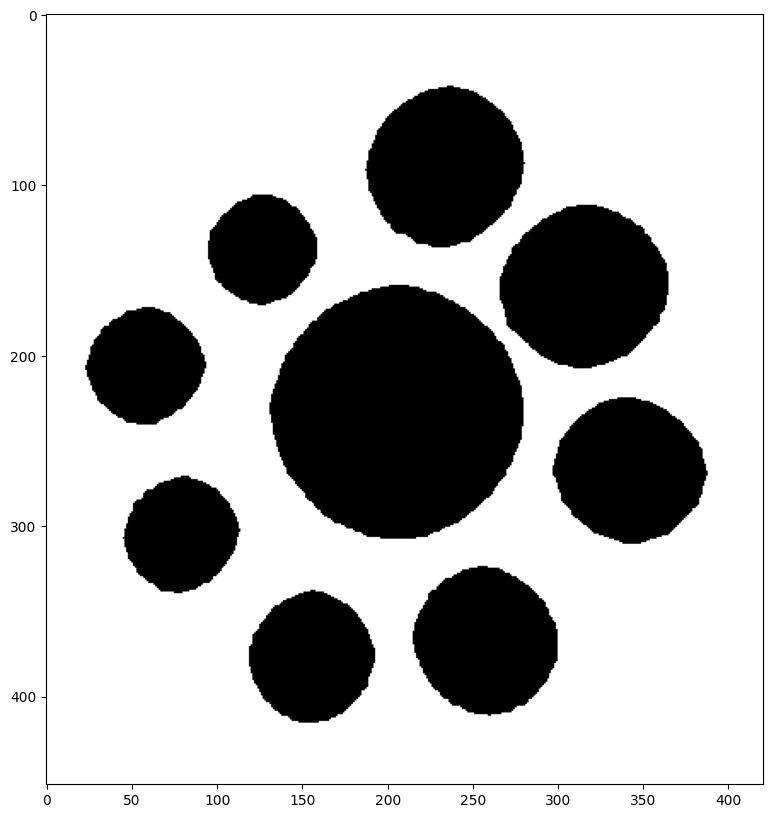

In [19]:
# they're all essentially good, personal choice I guess
choice2 = e_3x3cross
plt.imshow(choice2)

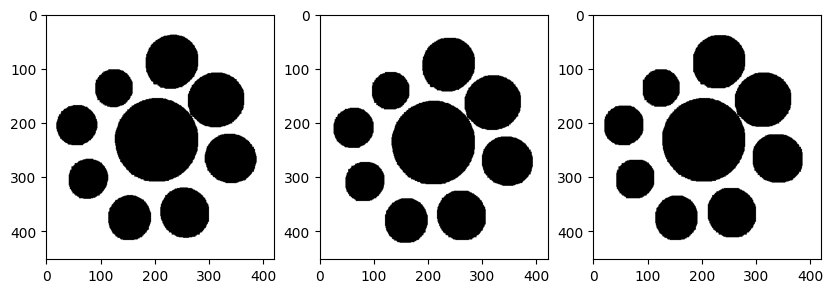

In [20]:
# using morphologyEx instead with rect kernels
# since the image I obtained is quite good, it only needs to patch the small holes
# this can be easily done using morphological close
i = 5 # iterations
c_3x3 = cv2.morphologyEx(max_not, cv2.MORPH_CLOSE, m_3x3rect, iterations = i)
c_4x4 = cv2.morphologyEx(max_not, cv2.MORPH_CLOSE, m_4x4rect, iterations = i)
c_5x5 = cv2.morphologyEx(max_not, cv2.MORPH_CLOSE, m_5x5rect, iterations = i)

plt.subplot(131)
plt.imshow(c_3x3)
plt.subplot(132)
plt.imshow(c_4x4)
plt.subplot(133)
plt.imshow(c_5x5)

## Create Simple BlobDetector

In [21]:
# Set up the SimpleBlobdetector with default parameters.
params = cv2.SimpleBlobDetector_Params()

params.blobColor = 0

params.minDistBetweenBlobs = 2

# Filter by Area.
params.filterByArea = False

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.8

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.8

# Filter by Inertia
params.filterByInertia =True
params.minInertiaRatio = 0.8

In [22]:
# Create SimpleBlobDetector
detector = cv2.SimpleBlobDetector_create(params)

Use **`detector.detect(image)`** to detect the blobs (coins). The output of the function is a list of **keypoints** where each keypoint is unique for each blob.

Print the number of coins detected as well.

In [23]:
# Detect blobs
out = detector.detect(choice2)
out_c3x3 = detector.detect(c_3x3)
out_c4x4 = detector.detect(c_4x4)
out_c5x5 = detector.detect(c_5x5)

In [24]:
# Print number of coins detected
print('There are {} coins in the image from dilate -> erosion'.format(len(out)))
print('There are {} coins in the image from morphologyEx 3x3'.format(len(out_c3x3)))
print('There are {} coins in the image from morphologyEx 4x4'.format(len(out_c4x4)))
print('There are {} coins in the image from morphologyEx 5x5'.format(len(out_c5x5)))
# seems the 4x4 rect dilate and 3x3 cross erode did a better job at keeping the coin borders clean
# than performing the morphologyEx


There are 9 coins in the image from dilate -> erosion
There are 7 coins in the image from morphologyEx 3x3
There are 7 coins in the image from morphologyEx 4x4
There are 7 coins in the image from morphologyEx 5x5


## <font style = "color:rgb(50,120,229)">Display the detected coins on original image</font>

Make sure to mark the center of the blobs as well.

In [25]:
# Mark coins using image annotation concepts we have studied so far
image2 = image.copy()
contours, hierarchy = cv2.findContours(choice2, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
cv2.drawContours(image2, contours[:len(contours)-1], -1, (0,255,0), 3);
for k in out:
    x, y = k.pt
    size = k.size
    cv2.circle(image2, (int(x),int(y)), 10, (255,0,0), -1)

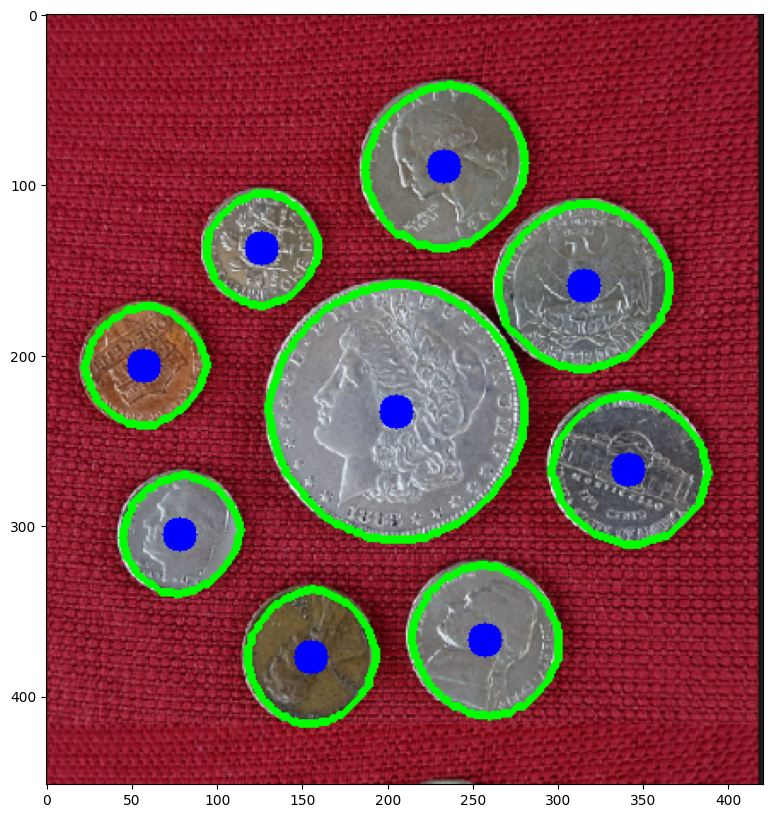

In [26]:
plt.imshow(image2[:,:,::-1])

## <font style = "color:rgb(50,120,229)">Perform Connected Component Analysis</font>

In the final step, perform Connected Component Analysis (CCA) on the binary image to find out the number of connected components. Do you think we can use CCA to calculate number of coins? Why/why not?

In [27]:
def displayConnectedComponents(im):
    imLabels = im
    # The following line finds the min and max pixel values
    # and their locations in an image.
    (minVal, maxVal, minLoc, maxLoc) = cv2.minMaxLoc(imLabels)
    # Normalize the image so the min value is 0 and max value is 255.
    imLabels = 255 * (imLabels - minVal)/(maxVal-minVal)
    # Convert image to 8-bits unsigned type
    imLabels = np.uint8(imLabels)
    # Apply a color map
    imColorMap = cv2.applyColorMap(imLabels, cv2.COLORMAP_JET)
    # Display colormapped labels
    plt.imshow(imColorMap[:,:,::-1])

In [28]:
# Find connected components
choice_not = cv2.bitwise_not(choice2)
_, coinlabels = cv2.connectedComponents(choice_not)

In [29]:
# Print number of connected components detected
print(coinlabels.max())
# Yes CCA can find the number of coins if you can segment each coin properly


9


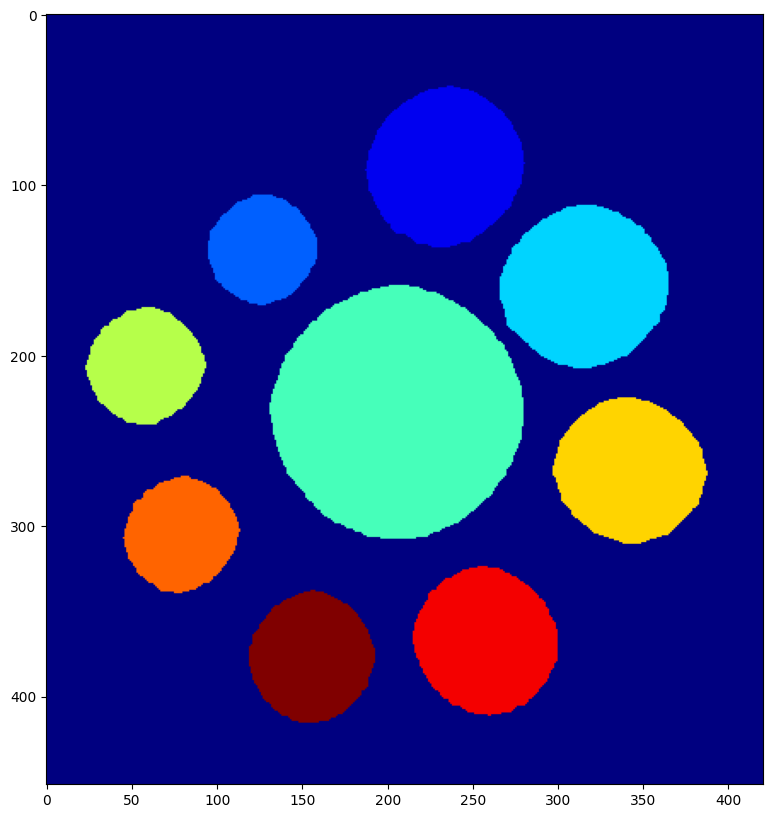

In [30]:
# Display connected components using displayConnectedComponents
displayConnectedComponents(coinlabels)

## Detect coins using Contour Detection

In the final step, perform Contour Detection on the binary image to find out the number of coins.

In [31]:
# Find all contours in the image
contours, hierarchy = cv2.findContours(choice2, cv2.RETR_LIST, cv2.CHAIN_APPROX_TC89_L1 )

In [32]:
print(len(contours))

10


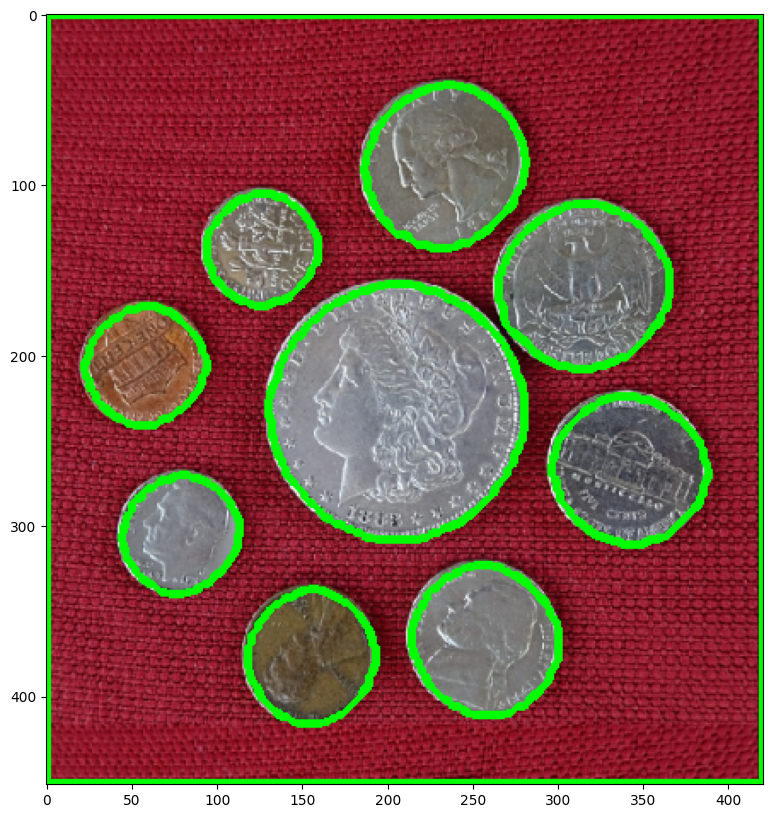

In [33]:
# Draw all contours
img = image.copy()
cv2.drawContours(img, contours, -1, (0,255,0), 3);
plt.imshow(img[:,:,::-1])


Let's only consider the outer contours.

In [34]:
help(cv2.rectangle)

Help on built-in function rectangle:

rectangle(...)
    rectangle(img, pt1, pt2, color[, thickness[, lineType[, shift]]]) -> img
    .   @brief Draws a simple, thick, or filled up-right rectangle.
    .   
    .   The function cv::rectangle draws a rectangle outline or a filled rectangle whose two opposite corners
    .   are pt1 and pt2.
    .   
    .   @param img Image.
    .   @param pt1 Vertex of the rectangle.
    .   @param pt2 Vertex of the rectangle opposite to pt1 .
    .   @param color Rectangle color or brightness (grayscale image).
    .   @param thickness Thickness of lines that make up the rectangle. Negative values, like #FILLED,
    .   mean that the function has to draw a filled rectangle.
    .   @param lineType Type of the line. See #LineTypes
    .   @param shift Number of fractional bits in the point coordinates.
    
    
    
    rectangle(img, rec, color[, thickness[, lineType[, shift]]]) -> img
    .   @overload
    .   
    .   use `rec` parameter as alterna

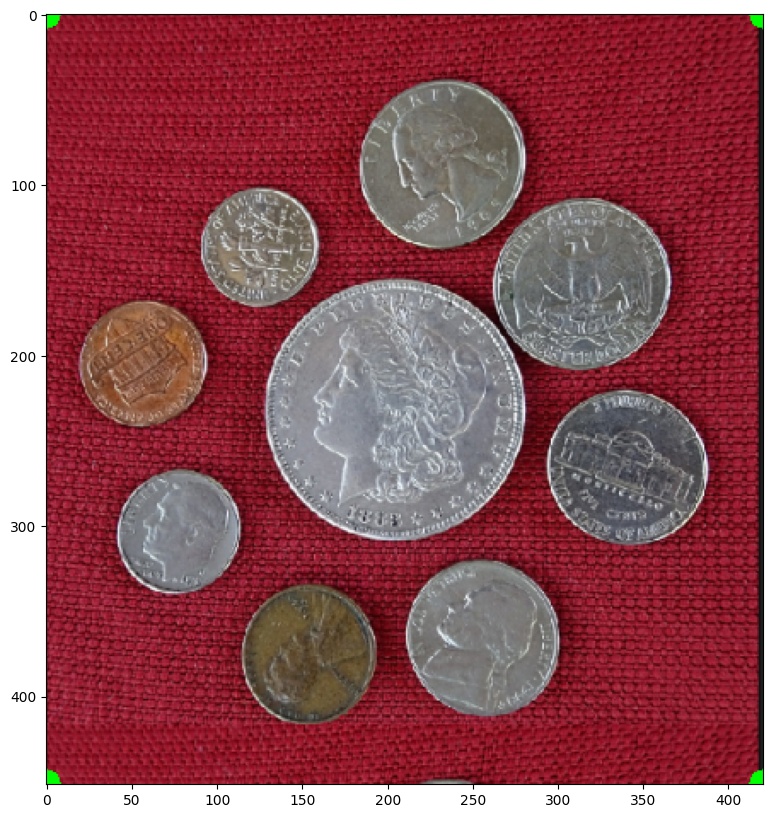

In [35]:
# Seems like its not drawing the borders completely so, I'll try using cv2.rectangle
# contours, hierarchy = cv2.findContours(choice2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
img = image.copy()
cv2.drawContours(img, contours[-1], -1, (0,255,0), 15);
plt.imshow(img[:,:,::-1])

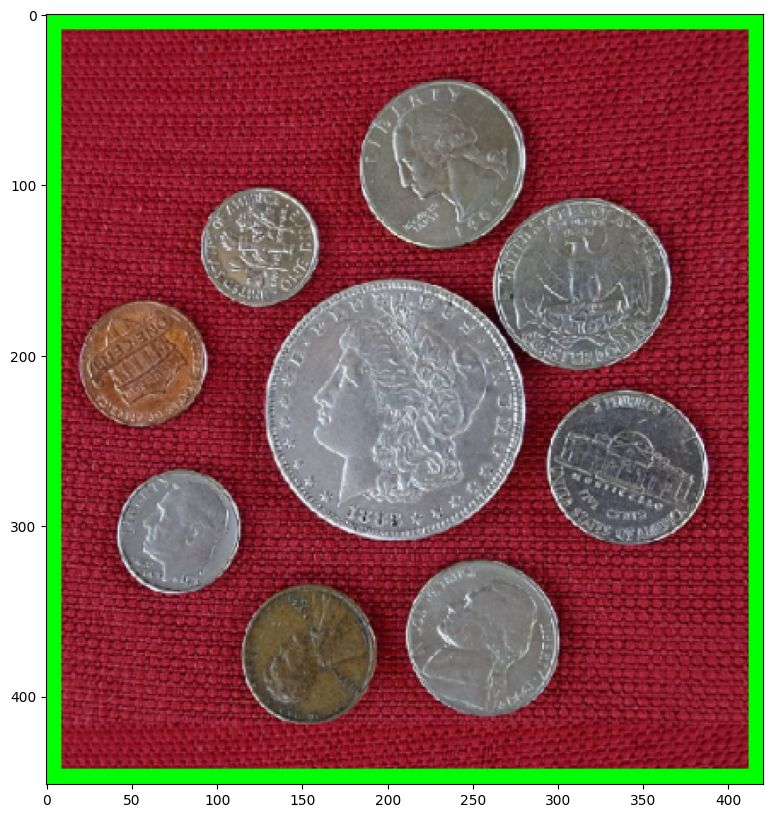

In [36]:
pointa = (contours[-1][0,0,0], contours[-1][0,0,1])
pointb = (contours[-1][2,0,0], contours[-1][2,0,1])
cv2.rectangle(img, pointa, pointb, (0,255,0), thickness = 15);
plt.imshow(img[:,:,::-1])

In [41]:
for index,cnt in enumerate(contours):
    area = cv2.contourArea(cnt)
    perimeter = cv2.arcLength(cnt, True)
    print("Contour #{} has area = {} and perimeter = {}".format(index+1,area,perimeter))

Contour #1 has area = 4454.0 and perimeter = 243.7263503074646
Contour #2 has area = 5767.5 and perimeter = 279.7227165699005
Contour #3 has area = 3577.5 and perimeter = 219.70749855041504
Contour #4 has area = 5951.0 and perimeter = 280.35204887390137
Contour #5 has area = 3692.5 and perimeter = 223.6487786769867
Contour #6 has area = 17233.5 and perimeter = 479.5070712566376
Contour #7 has area = 7377.0 and perimeter = 314.2715365886688
Contour #8 has area = 3245.5 and perimeter = 207.46019887924194
Contour #9 has area = 6799.5 and perimeter = 301.14204263687134
Contour #10 has area = 189420.0 and perimeter = 1742.0


In [42]:
# Print maximum area of contour
# This will be the box that we want to remove
###
area = cv2.contourArea(contours[-1])
print('Maximum area of contour = ' + str(area))
###

Maximum area of contour = 189420.0


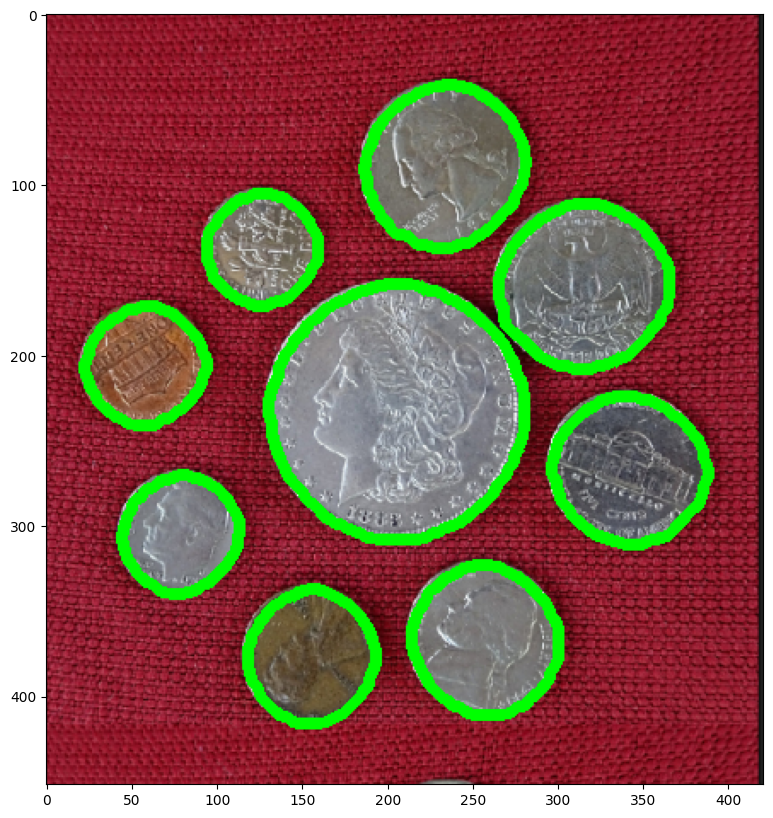

In [44]:
# Assuming contours is the first element returned by cv2.findContours
img = image.copy()
contours_copy = list(contours)  # Convert tuple to list since we need to modify it
max_area = 0
max_index = -1

# Find the contour with the maximum area
for index, cnt in enumerate(contours_copy):
    area = cv2.contourArea(cnt)
    if area > max_area:
        max_area = area
        max_index = index

# Remove the contour with the maximum area
if max_index != -1:
    del contours_copy[max_index]

# Draw the remaining contours
cv2.drawContours(img, contours_copy, -1, (0, 255, 0), 5)
plt.imshow(img[:, :, ::-1])
plt.show()


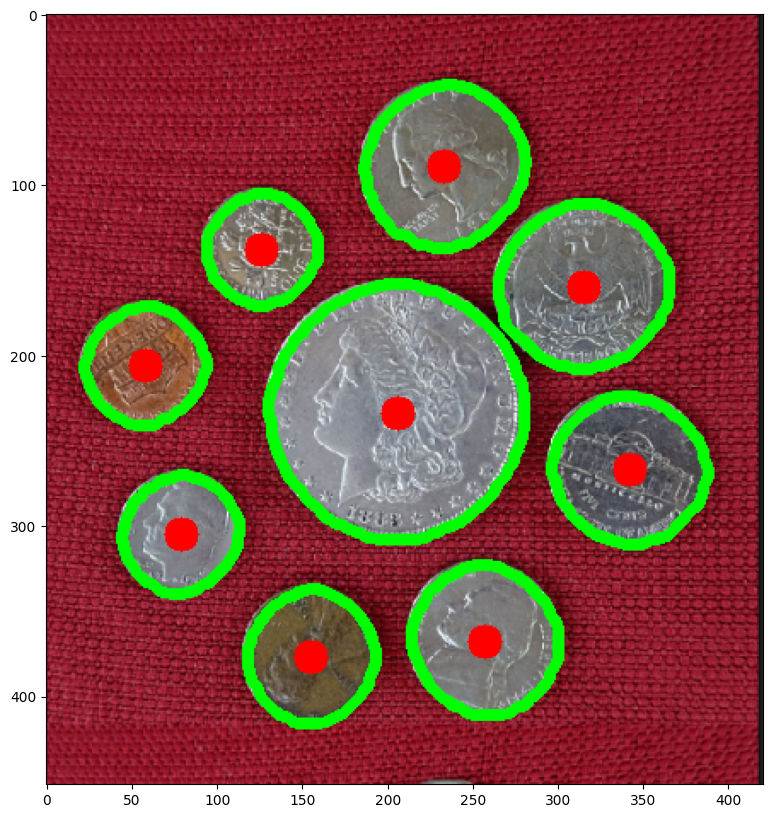

In [45]:
for index,cnt in enumerate(contours_copy):
    M = cv2.moments(cnt)
    x = int(round(M["m10"]/M["m00"]))
    y = int(round(M["m01"]/M["m00"]))
    # Mark the center
    cv2.circle(img, (x,y), 10, (0,0,255), -1);
plt.imshow(img[:,:,::-1])